In [1]:
import os
import sys
import rasterio
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from rasterio.mask import mask
from rasterio.plot import show

# Configuración de Rutas
project_root = Path("..").resolve()
sys.path.append(str(project_root))

processed_dir = project_root / "data" / "processed"
vector_dir = project_root / "data" / "vector"
output_dirs = {
    "figures": project_root / "outputs" / "figures",
    "reports": project_root / "outputs" / "reports"
}

# Crear carpetas de salida si no existen
for path in output_dirs.values():
    path.mkdir(parents=True, exist_ok=True)

print(f"📂 Directorio de datos procesados: {processed_dir}")

📂 Directorio de datos procesados: D:\laboratorio_cambio_urbano\data\processed


In [2]:
# Celda 2: Verificación y Ejecución Automática de Procesamiento
# ============================================================
import subprocess

# Verificar si existen archivos procesados
archivos_indices = list(processed_dir.glob("indices_*.tif"))

if len(archivos_indices) == 0:
    print("⚠️ No se encontraron índices calculados. Ejecutando script de procesamiento...")
    print("⏳ Esto puede tardar unos segundos...")
    
    # Ejecutar script calculate_indices.py
    script_path = project_root / "scripts" / "calculate_indices.py"
    result = subprocess.run(["python", str(script_path)], capture_output=True, text=True)
    
    if result.returncode == 0:
        print("✅ Procesamiento completado exitosamente.")
        print(result.stdout)
    else:
        print("❌ Error en el script de procesamiento:")
        print(result.stderr)
else:
    print(f"✅ Se encontraron {len(archivos_indices)} archivos procesados. Saltando cálculo.")

✅ Se encontraron 7 archivos procesados. Saltando cálculo.


In [3]:
# 1. Leer Metadata Generada
metadata_file = processed_dir / "metadata.txt"

print("=== REPORTE DE PROCESAMIENTO (metadata.txt) ===")
if metadata_file.exists():
    with open(metadata_file, "r", encoding="utf-8") as f:
        print(f.read())
else:
    print("⚠️ No se encontró el archivo metadata.txt")

# 2. Listar imágenes de índices
imagenes = sorted(list(processed_dir.glob("indices_*.tif")))
print(f"\n✅ Se encontraron {len(imagenes)} imágenes de índices procesados.")

=== REPORTE DE PROCESAMIENTO (metadata.txt) ===
METADATOS DE ÍNDICES ESPECTRALES (PROCESSED)
Generado el: 2026-01-25 02:38:09

Archivo: indices_2019.tif
 - Año: 2019
 - Bandas: 1:NDVI, 2:NDBI, 3:NDWI, 4:BSI
 - Estadísticas (Promedio):
   * NDVI: 0.317
   * NDBI: 0.033
   * NDWI: -0.318
   * BSI:  0.009
------------------------------
Archivo: indices_2020.tif
 - Año: 2020
 - Bandas: 1:NDVI, 2:NDBI, 3:NDWI, 4:BSI
 - Estadísticas (Promedio):
   * NDVI: 0.247
   * NDBI: 0.097
   * NDWI: -0.297
   * BSI:  0.119
------------------------------
Archivo: indices_2021.tif
 - Año: 2021
 - Bandas: 1:NDVI, 2:NDBI, 3:NDWI, 4:BSI
 - Estadísticas (Promedio):
   * NDVI: 0.295
   * NDBI: 0.034
   * NDWI: -0.313
   * BSI:  0.043
------------------------------
Archivo: indices_2022.tif
 - Año: 2022
 - Bandas: 1:NDVI, 2:NDBI, 3:NDWI, 4:BSI
 - Estadísticas (Promedio):
   * NDVI: 0.245
   * NDBI: 0.102
   * NDWI: -0.283
   * BSI:  0.101
------------------------------
Archivo: indices_2023.tif
 - Año: 2023
 -

📊 Calculando estadísticas anuales (Media, Std, Min, Max) dentro de la comuna...
💾 Gráfico guardado en: D:\laboratorio_cambio_urbano\outputs\figures\02_tendencias_indices.png


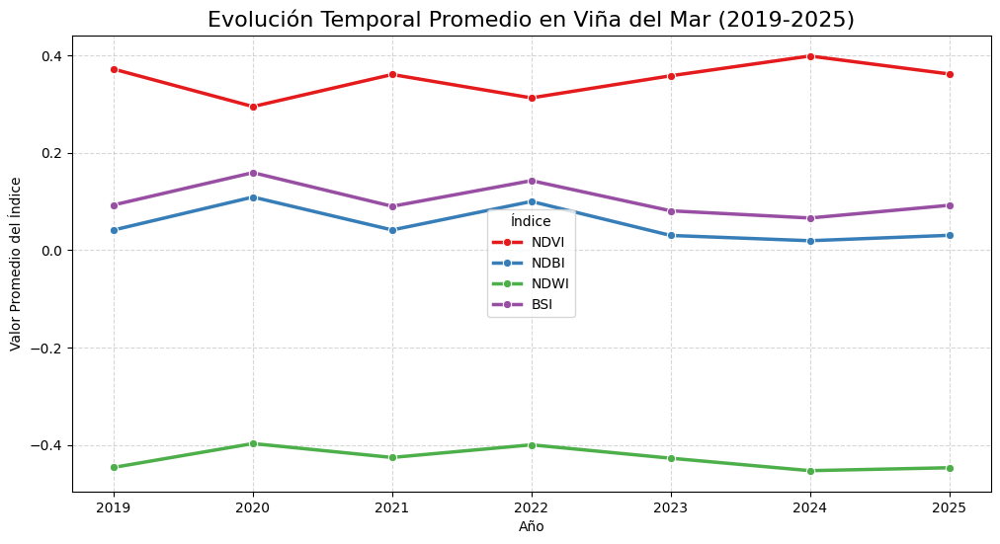

💾 Tabla de datos COMPLETA guardada en: D:\laboratorio_cambio_urbano\outputs\reports\02_estadisticas_anuales.csv

--- Vista Previa (Media y Desviación Estándar) ---


Media                                     Std                      \
Índice       BSI      NDBI      NDVI      NDWI       BSI      NDBI      NDVI   
Año                                                                            
2019    0.092865  0.041366  0.371902 -0.446443  0.125019  0.136480  0.206433   
2020    0.159198  0.109027  0.294934 -0.397417  0.109979  0.128423  0.175273   
2021    0.090059  0.041412  0.360846 -0.426015  0.118933  0.130217  0.204276   
2022    0.142718  0.100001  0.312770 -0.400017  0.108579  0.126733  0.181418   
2023    0.080777  0.030151  0.358188 -0.427539  0.119306  0.131565  0.200353   
2024    0.065982  0.019308  0.398819 -0.453125  0.130095  0.140301  0.220662   
2025    0.092068  0.030388  0.361941 -0.447134  0.125962  0.134405  0.210280   

                  
Índice      NDWI  
Año               
2019    0.166252  
2020    0.147567  
2021    0.164744  
2022    0.148716  
2023    0.161929  
2024    0.173105  
2025    0.173514

In [11]:
# ====================================================
# Celda 4: Cálculo de Estadísticas y Reporte Completo (CORREGIDA CON MÁSCARA)
# ====================================================
# Cargar límite para asegurar que medimos SOLO Viña del Mar
gdf_limite_global = gpd.read_file(vector_dir / "limite_comuna.gpkg")

data_stats = []
nombres_indices = {1: "NDVI", 2: "NDBI", 3: "NDWI", 4: "BSI"}

print("📊 Calculando estadísticas anuales (Media, Std, Min, Max) dentro de la comuna...")

for img in imagenes:
    year = img.stem.split("_")[1]
    
    with rasterio.open(img) as src:
        # 1. Gestionar proyección
        if gdf_limite_global.crs != src.crs: 
            gdf_recorte = gdf_limite_global.to_crs(src.crs)
        else:
            gdf_recorte = gdf_limite_global
            
        # 2. APLICAR MÁSCARA DE RECORTE (Esto elimina lo que está fuera de la comuna)
        out_image, _ = mask(src, gdf_recorte.geometry, crop=True)
        
        # out_image tiene shape (bandas, alto, ancho)
        
        # Band 1=NDVI, 2=NDBI, 3=NDWI, 4=BSI
        # Nota: En out_image los índices parten de 0 (0=Banda 1 del archivo)
        for i, nombre in nombres_indices.items():
            # i es 1,2,3,4 -> restamos 1 para obtener el índice 0,1,2,3
            banda_data = out_image[i-1] 
            
            # 3. FILTRADO RIGUROSO
            # - Debe ser finito (no nan, no inf)
            # - Debe ser distinto de 0 (El 0 es el fondo/relleno de la máscara)
            valid_pixels = banda_data[(np.isfinite(banda_data)) & (banda_data != 0)]
            
            if len(valid_pixels) > 0:
                data_stats.append({
                    "Año": int(year),
                    "Índice": nombre,
                    "Media": np.nanmean(valid_pixels),
                    "Std": np.nanstd(valid_pixels),
                    "Min": np.nanmin(valid_pixels),
                    "Max": np.nanmax(valid_pixels)
                })

df_stats = pd.DataFrame(data_stats)

# --- GRÁFICO DE TENDENCIAS ---
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_stats, x="Año", y="Media", hue="Índice", marker="o", linewidth=2.5, palette="Set1")
plt.title("Evolución Temporal Promedio en Viña del Mar (2019-2025)", fontsize=16)
plt.ylabel("Valor Promedio del Índice")
plt.grid(True, linestyle='--', alpha=0.5)

# Guardar Gráfico
fig_path = output_dirs["figures"] / "02_tendencias_indices.png"
plt.savefig(fig_path, dpi=300, bbox_inches='tight')
print(f"💾 Gráfico guardado en: {fig_path}")

plt.show()

# --- GUARDAR TABLA CSV COMPLETA ---
csv_path = output_dirs["reports"] / "02_estadisticas_anuales.csv"
df_stats.to_csv(csv_path, index=False) 
print(f"💾 Tabla de datos COMPLETA guardada en: {csv_path}")

# Mostrar un resumen visual
print("\n--- Vista Previa (Media y Desviación Estándar) ---")
display(df_stats.pivot(index="Año", columns="Índice", values=["Media", "Std"]))

🎨 Generando mapas multiespectrales (Título arreglado + Significados)...
   💾 Mapa 2019 guardado.


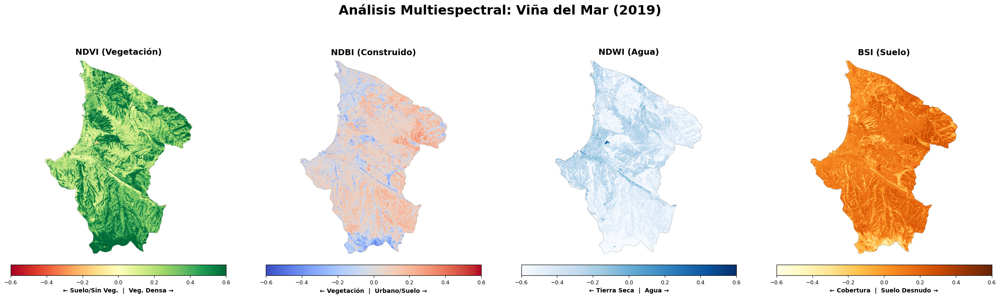

   💾 Mapa 2020 guardado.


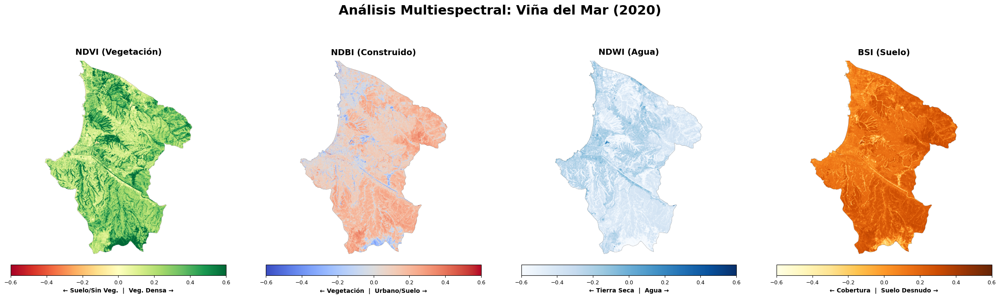

   💾 Mapa 2021 guardado.


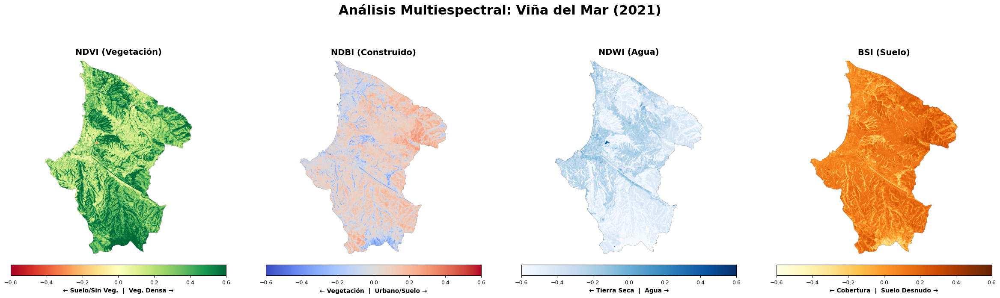

   💾 Mapa 2022 guardado.


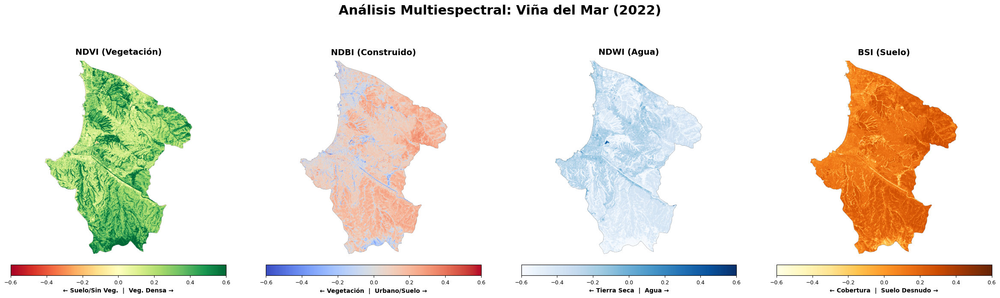

   💾 Mapa 2023 guardado.


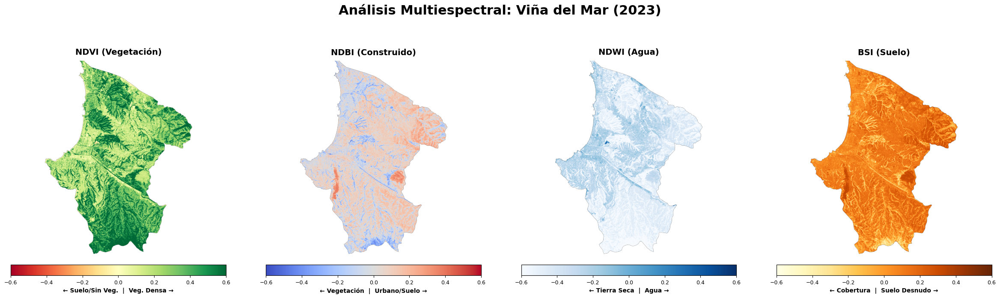

   💾 Mapa 2024 guardado.


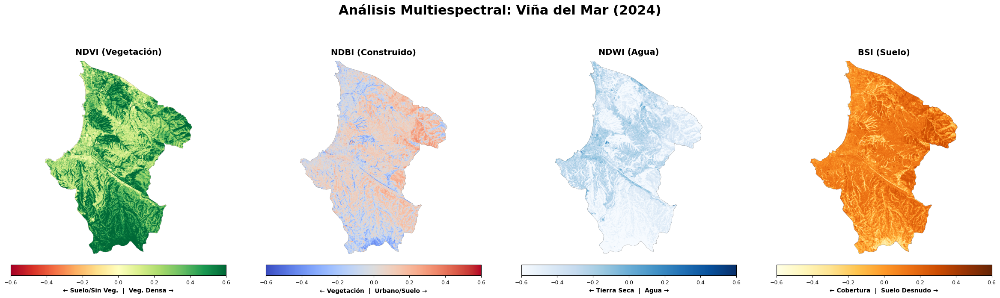

   💾 Mapa 2025 guardado.


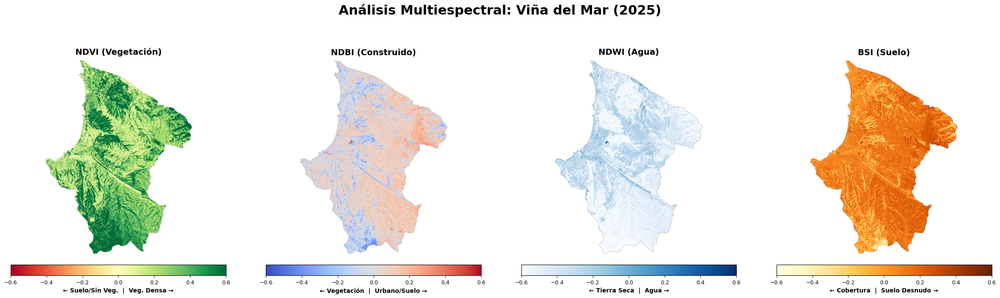

✅ Generación completada con éxito.


In [5]:
# ====================================================
# Celda 5: Generación de Mapas Multiespectrales (CORREGIDA)
# ====================================================

# Cargar límite para recorte estético
gdf_limite_global = gpd.read_file(vector_dir / "limite_comuna.gpkg")

print("🎨 Generando mapas multiespectrales (Título arreglado + Significados)...")

for img in imagenes:
    year = img.stem.split("_")[1]
    
    with rasterio.open(img) as src:
        # 1. Gestionar proyección
        if gdf_limite_global.crs != src.crs: 
            gdf_recorte = gdf_limite_global.to_crs(src.crs)
        else:
            gdf_recorte = gdf_limite_global
        
        # 2. Recortar
        out_image, out_transform = mask(src, gdf_recorte.geometry, crop=True)
        
        # 3. Extraer bandas
        ndvi = out_image[0].astype(float)
        ndbi = out_image[1].astype(float)
        ndwi = out_image[2].astype(float)
        bsi  = out_image[3].astype(float)

        # Configuración de ploteo + SIGNIFICADOS
        # Formato: (Data, Título, MapaColor, Significado Bajo, Significado Alto)
        indices_plot = [
            (ndvi, "NDVI (Vegetación)", "RdYlGn", "Suelo/Sin Veg.", "Veg. Densa"), 
            (ndbi, "NDBI (Construido)", "coolwarm", "Vegetación", "Urbano/Suelo"), 
            (ndwi, "NDWI (Agua)",       "Blues",    "Tierra Seca",    "Agua"),       
            (bsi,  "BSI (Suelo)",       "YlOrBr",   "Cobertura",      "Suelo Desnudo") 
        ]

        # Crear figura
        fig, axes = plt.subplots(1, 4, figsize=(24, 7)) # Aumenté un poco el alto
        
        for ax, (data, title, cmap, desc_min, desc_max) in zip(axes, indices_plot):
            # Limpieza visual
            data[data == 0] = np.nan 
            
            # Ploteo
            im = ax.imshow(data, cmap=cmap, vmin=-0.6, vmax=0.6) 
            ax.set_title(title, fontsize=14, fontweight='bold', pad=10)
            ax.axis('off')
            
            # BARRA DE COLOR CON SIGNIFICADO
            # Fraction y pad ajustan el tamaño y separación de la barra
            cbar = fig.colorbar(im, ax=ax, orientation='horizontal', fraction=0.05, pad=0.05)
            cbar.ax.tick_params(labelsize=9) 
            
            # Etiqueta explicativa debajo de la barra
            cbar.set_label(f"← {desc_min}  |  {desc_max} →", fontsize=10, fontweight='bold')
            
        # TÍTULO PRINCIPAL (Arreglado)
        plt.suptitle(f"Análisis Multiespectral: Viña del Mar ({year})", fontsize=22, fontweight='bold')
        
        # AJUSTE DE ESPACIO (La clave para que no se vea feo)
        # rect=[left, bottom, right, top] -> Reservamos el top para el título
        plt.tight_layout(rect=[0, 0, 1, 0.92])
        
        # Guardar
        save_path = output_dirs["figures"] / f"02_mapa_indices_{year}.png"
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"   💾 Mapa {year} guardado.")
        
        plt.show() 
        plt.close() 
        
print("✅ Generación completada con éxito.")

🎨 Generando mapas de evolución para: NDVI...
   💾 Guardado: 02_mapa_evolucion_NDVI.png


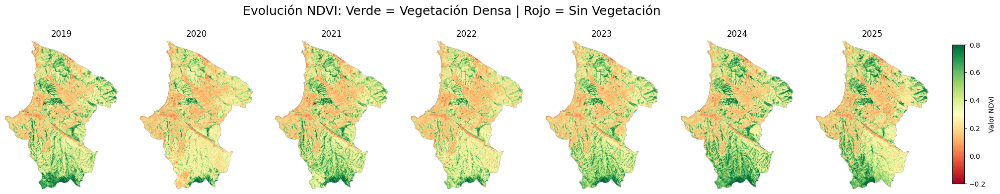

🎨 Generando mapas de evolución para: NDBI...
   💾 Guardado: 02_mapa_evolucion_NDBI.png


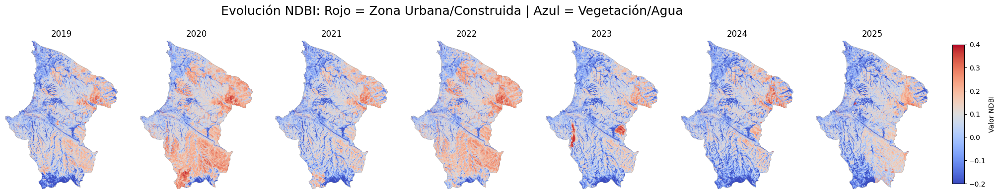

🎨 Generando mapas de evolución para: NDWI...
   💾 Guardado: 02_mapa_evolucion_NDWI.png


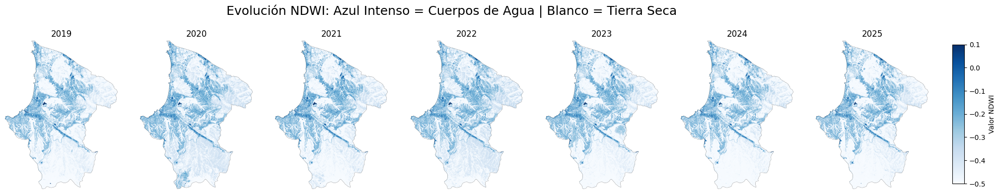

🎨 Generando mapas de evolución para: BSI...
   💾 Guardado: 02_mapa_evolucion_BSI.png


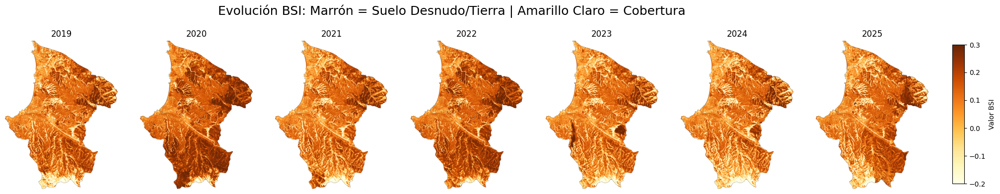

In [ ]:
# Mapas de Evolución (CORREGIDA)
# =======================================

# Cargar límite para recorte estético (Variable Global)
gdf_limite_global = gpd.read_file(vector_dir / "limite_comuna.gpkg")

# Función para plotear una tira de años
def plot_evolution(band_idx, index_name, cmap, vmin, vmax, description):
    # Configurar figura ancha (1 fila, N columnas)
    fig, axes = plt.subplots(1, len(imagenes), figsize=(24, 4))
    
    print(f"🎨 Generando mapas de evolución para: {index_name}...")
    
    for idx, img in enumerate(imagenes):
        year = img.stem.split("_")[1]
        ax = axes[idx]
        
        with rasterio.open(img) as src:
            # 1. Gestionar proyección (Usando una variable local temporal para no romper la global)
            if gdf_limite_global.crs != src.crs: 
                gdf_recorte = gdf_limite_global.to_crs(src.crs)
            else:
                gdf_recorte = gdf_limite_global
            
            # 2. Recortar
            out_image, out_transform = mask(src, gdf_recorte.geometry, crop=True)
            
            # 3. Leer banda y HACER COPIA (Crucial para poder modificarla)
            # .astype(float) crea una copia automáticamente
            data = out_image[band_idx - 1].astype(float)
            
            # 4. Limpiar fondo (Ahora sí funciona porque es una copia modificable)
            data[data == 0] = np.nan
            
            # Plotear
            im = ax.imshow(data, cmap=cmap, vmin=vmin, vmax=vmax)
            ax.set_title(f"{year}", fontsize=12)
            ax.axis('off')
    
    # Añadir barra de color común
    cbar_ax = fig.add_axes([0.92, 0.15, 0.01, 0.7]) 
    cbar = fig.colorbar(im, cax=cbar_ax)
    cbar.set_label(f"Valor {index_name}")
    
    # Título Principal
    fig.suptitle(f"Evolución {index_name}: {description}", fontsize=18, y=1.05)
    
    # Guardar
    save_path = output_dirs["figures"] / f"02_mapa_evolucion_{index_name}.png"
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    print(f"   💾 Guardado: {save_path.name}")
    plt.show()

# --- EJECUTAR PARA CADA ÍNDICE ---
plot_evolution(1, "NDVI", "RdYlGn", -0.2, 0.8, "Verde = Vegetación Densa | Rojo = Sin Vegetación")
plot_evolution(2, "NDBI", "coolwarm", -0.2, 0.4, "Rojo = Zona Urbana/Construida | Azul = Vegetación/Agua")
plot_evolution(3, "NDWI", "Blues", -0.5, 0.1, "Azul Intenso = Cuerpos de Agua | Blanco = Tierra Seca")
plot_evolution(4, "BSI", "YlOrBr", -0.2, 0.3, "Marrón = Suelo Desnudo/Tierra | Amarillo Claro = Cobertura")

🌍 Calculando evolución de superficies clasificadas (Lógica Estricta)...
💾 Tabla corregida guardada en: D:\laboratorio_cambio_urbano\outputs\reports\02_superficies_clasificadas.csv


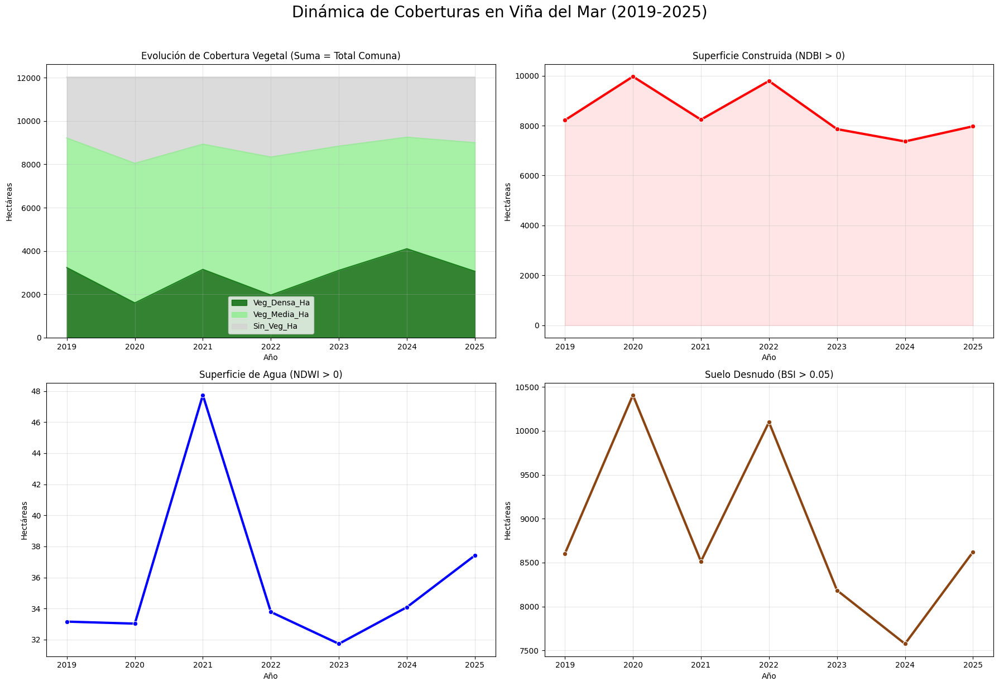

,Año,Total_Ha,Veg_Densa_Ha,Veg_Media_Ha,Sin_Veg_Ha,Urbano_Ha,Agua_Ha,Suelo_Ha
0,2019,12023.46,3233.74,5980.27,2809.45,8216.54,33.16,8602.52
1,2020,12023.85,1604.03,6444.00,3975.82,9965.93,33.03,10406.64
2,2021,12023.98,3151.83,5779.79,3092.36,8238.25,47.74,8513.69
3,2022,12023.94,1964.92,6371.59,3687.43,9788.56,33.78,10098.71
4,2023,12023.51,3107.56,5732.80,3183.15,7859.47,31.73,8185.00
5,2024,12023.93,4103.07,5147.92,2772.94,7364.48,34.09,7575.60
6,2025,12024.02,3062.20,5937.80,3024.02,7972.60,37.42,8621.64


In [10]:
# ====================================================
# Celda 4.2: Clasificación de Coberturas y Cálculo de Áreas (CORREGIDA)
# ====================================================
print("🌍 Calculando evolución de superficies clasificadas (Lógica Estricta)...")

resultados_clases = []

for img in imagenes:
    year = img.stem.split("_")[1]
    
    with rasterio.open(img) as src:
        # Recorte exacto
        if gdf_limite_global.crs != src.crs: 
            gdf_recorte = gdf_limite_global.to_crs(src.crs)
        else:
            gdf_recorte = gdf_limite_global
            
        out_image, _ = mask(src, gdf_recorte.geometry, crop=True)
        
        ndvi = out_image[0]
        ndbi = out_image[1]
        ndwi = out_image[2]
        bsi  = out_image[3]
        
        # --- MÁSCARA MAESTRA DE VALIDEZ ---
        # Un píxel es válido solo si está dentro de la comuna (NDVI != 0) 
        # Y es un número real (no infinito, no error)
        valid_mask = (ndvi != 0) & np.isfinite(ndvi)
        
        # Total Real (Base para porcentajes)
        total_pixels = np.count_nonzero(valid_mask)
        factor_ha = 0.01
        area_total_ha = total_pixels * factor_ha
        
        # --- CLASIFICACIÓN (Aplicando valid_mask a todo) ---
        
        # 1. Vegetación (Solo píxeles válidos)
        veg_densa = np.count_nonzero((ndvi > 0.5) & valid_mask)
        veg_media = np.count_nonzero((ndvi >= 0.2) & (ndvi <= 0.5) & valid_mask)
        sin_veg   = np.count_nonzero((ndvi < 0.2) & valid_mask) 
        # Nota: Ahora 'sin_veg' NO contará el borde negro de la imagen
        
        # 2. Otros Índices
        urbano = np.count_nonzero((ndbi > 0) & valid_mask)
        agua   = np.count_nonzero((ndwi > 0) & valid_mask)
        suelo  = np.count_nonzero((bsi > 0.05) & valid_mask)
        
        resultados_clases.append({
            "Año": int(year),
            "Total_Ha": area_total_ha,
            "Veg_Densa_Ha": veg_densa * factor_ha,
            "Veg_Media_Ha": veg_media * factor_ha,
            "Sin_Veg_Ha": sin_veg * factor_ha,
            "Urbano_Ha": urbano * factor_ha,
            "Agua_Ha": agua * factor_ha,
            "Suelo_Ha": suelo * factor_ha
        })

df_clases = pd.DataFrame(resultados_clases)

# Guardar
csv_path = output_dirs["reports"] / "02_superficies_clasificadas.csv"
df_clases.to_csv(csv_path, index=False)
print(f"💾 Tabla corregida guardada en: {csv_path}")

# --- GRÁFICOS ---
fig, axes = plt.subplots(2, 2, figsize=(18, 12))

# 1. Vegetación
df_clases.plot(x="Año", y=["Veg_Densa_Ha", "Veg_Media_Ha", "Sin_Veg_Ha"], 
               kind="area", stacked=True, color=["darkgreen", "lightgreen", "lightgray"], 
               alpha=0.8, ax=axes[0, 0])
axes[0, 0].set_title("Evolución de Cobertura Vegetal (Suma = Total Comuna)")
axes[0, 0].set_ylabel("Hectáreas")

# 2. Urbano
sns.lineplot(data=df_clases, x="Año", y="Urbano_Ha", marker="o", color="red", linewidth=3, ax=axes[0, 1])
axes[0, 1].set_title("Superficie Construida (NDBI > 0)")
axes[0, 1].set_ylabel("Hectáreas")
axes[0, 1].fill_between(df_clases["Año"], df_clases["Urbano_Ha"], color="red", alpha=0.1)

# 3. Agua
sns.lineplot(data=df_clases, x="Año", y="Agua_Ha", marker="o", color="blue", linewidth=3, ax=axes[1, 0])
axes[1, 0].set_title("Superficie de Agua (NDWI > 0)")
axes[1, 0].set_ylabel("Hectáreas")

# 4. Suelo
sns.lineplot(data=df_clases, x="Año", y="Suelo_Ha", marker="o", color="saddlebrown", linewidth=3, ax=axes[1, 1])
axes[1, 1].set_title("Suelo Desnudo (BSI > 0.05)")
axes[1, 1].set_ylabel("Hectáreas")

for ax in axes.flat: ax.grid(True, alpha=0.3)

plt.suptitle("Dinámica de Coberturas en Viña del Mar (2019-2025)", fontsize=20, y=1.02)
plt.tight_layout()

save_path = output_dirs["figures"] / "02_evolucion_superficies_completa.png"
plt.savefig(save_path, dpi=300, bbox_inches='tight')
plt.show()

# Verificamos que ahora sí cuadren los números
display(df_clases)

📉 Generando histogramas anuales (Visualización Activada)...
   💾 Histograma 2019 guardado.


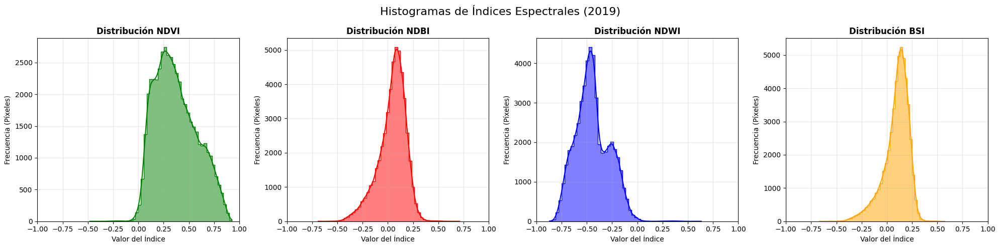

   💾 Histograma 2020 guardado.


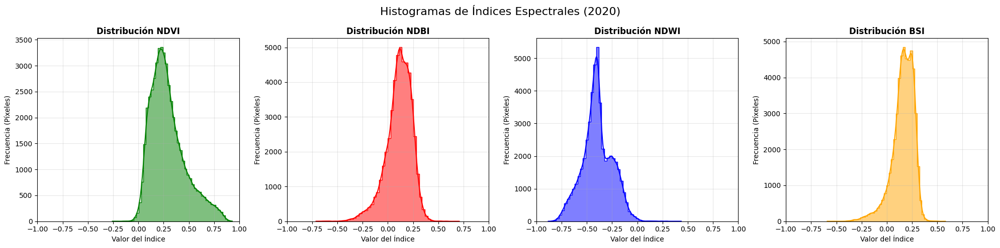

   💾 Histograma 2021 guardado.


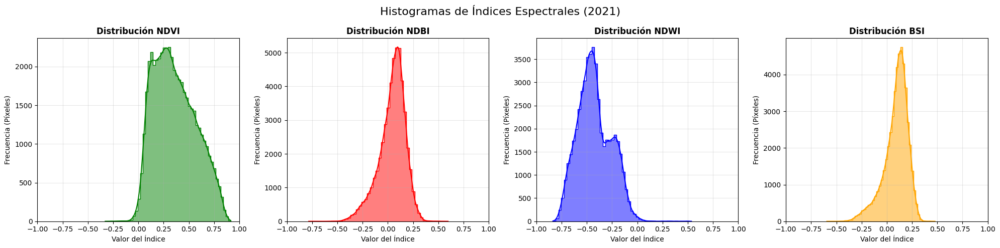

   💾 Histograma 2022 guardado.


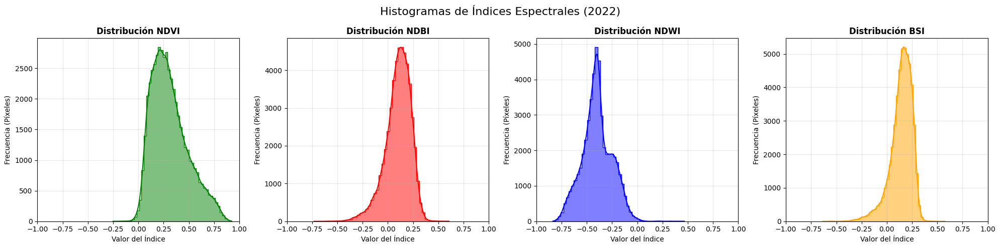

   💾 Histograma 2023 guardado.


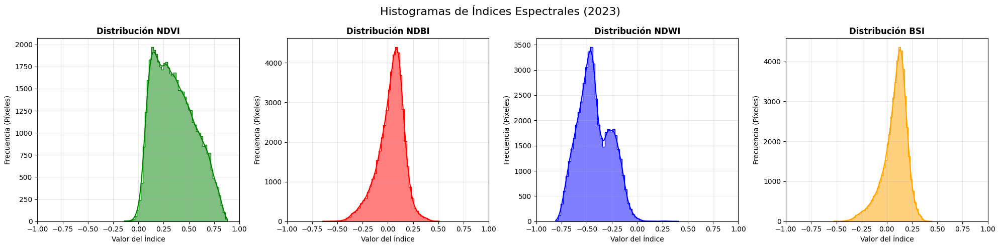

   💾 Histograma 2024 guardado.


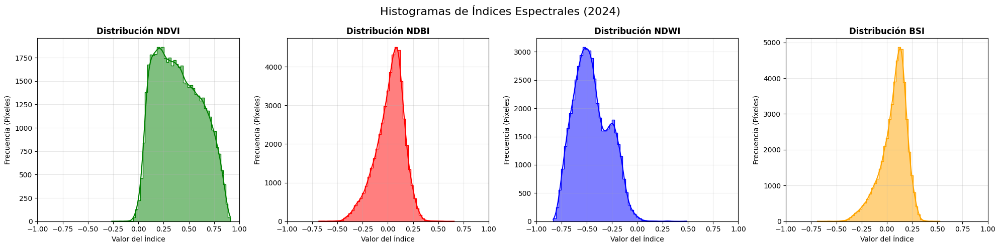

   💾 Histograma 2025 guardado.


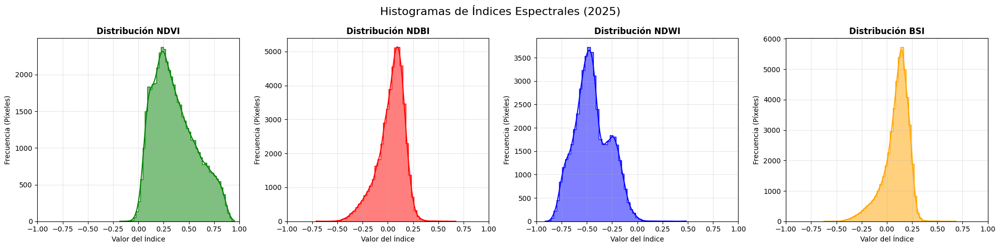

✅ Generación de histogramas completada.


In [7]:
# ====================================================
# Celda 7: Histogramas de Índices (CORREGIDA CON EJES)
# ====================================================

print("📉 Generando histogramas anuales (Visualización Activada)...")

labels = ["NDVI", "NDBI", "NDWI", "BSI"]
colors = ["green", "red", "blue", "orange"]

for img in imagenes:
    year = img.stem.split("_")[1]
    
    with rasterio.open(img) as src:
        # Gestión de proyección y recorte
        if gdf_limite_global.crs != src.crs: 
            gdf_recorte = gdf_limite_global.to_crs(src.crs)
        else:
            gdf_recorte = gdf_limite_global
            
        out_image, _ = mask(src, gdf_recorte.geometry, crop=True)
        
        # Extraer datos
        datas = [
            out_image[0].flatten(), # NDVI
            out_image[1].flatten(), # NDBI
            out_image[2].flatten(), # NDWI
            out_image[3].flatten()  # BSI
        ]
        
        fig, axes = plt.subplots(1, 4, figsize=(20, 5))

        for ax, data, label, color in zip(axes, datas, labels, colors):
            # Limpieza
            data = data.astype(float)
            valid_values = data[np.isfinite(data)]
            valid_values = valid_values[valid_values != 0] 
            
            # Sampleo
            if len(valid_values) > 50000:
                valid_values = np.random.choice(valid_values, 50000, replace=False)
            
            sns.histplot(valid_values, bins=50, kde=True, color=color, ax=ax, element="step")
            
            # --- ETIQUETAS DE EJES (NUEVO) ---
            ax.set_title(f"Distribución {label}", fontsize=12, fontweight='bold')
            ax.set_xlabel("Valor del Índice")
            ax.set_ylabel("Frecuencia (Píxeles)")
            
            ax.set_xlim(-1, 1) 
            ax.grid(True, alpha=0.3)

        plt.suptitle(f"Histogramas de Índices Espectrales ({year})", fontsize=16)
        plt.tight_layout()

        save_path = output_dirs["figures"] / f"02_histogramas_indices_{year}.png"
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"   💾 Histograma {year} guardado.")
        
        plt.show() 
        plt.close()

print("✅ Generación de histogramas completada.")

📉 Muestreando datos de los 4 índices...
💾 Gráfico guardado: 02_distribucion_NDVI_NDBI_split.png


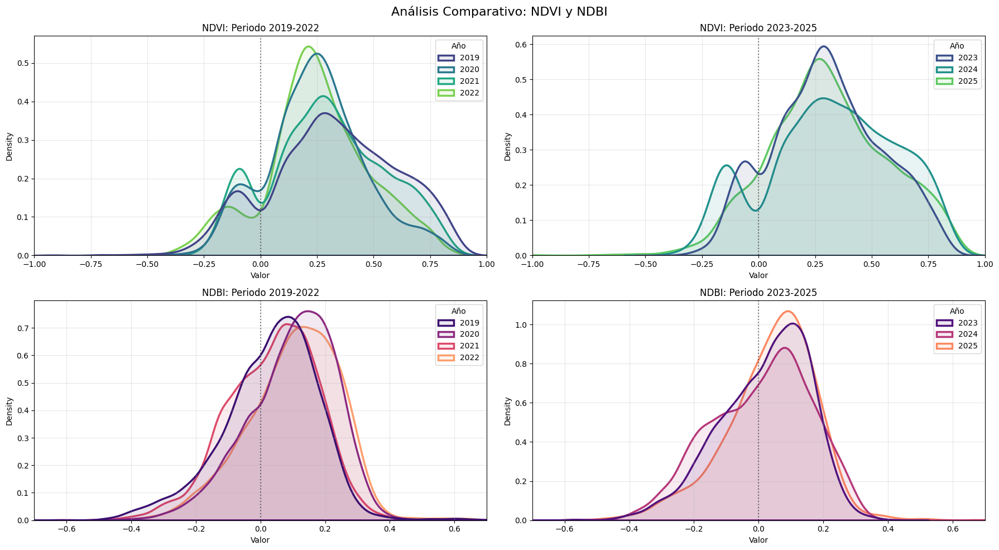

💾 Gráfico guardado: 02_distribucion_NDWI_BSI_split.png


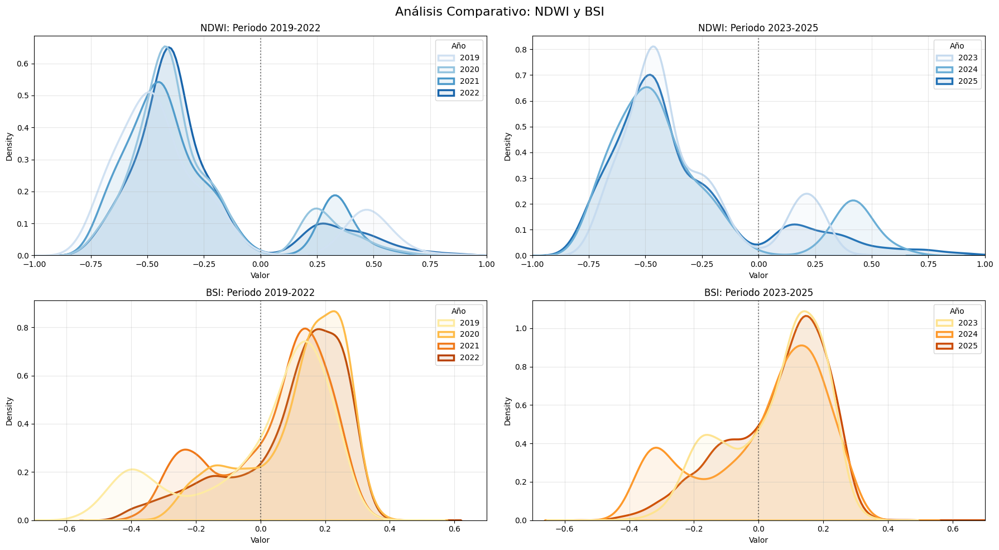

In [21]:
# Celda 5: Comparación de Distribuciones (KDE Dividido - RANGOS COMPLETOS)
# =========================================================================
import seaborn as sns

# Configuración
SAMPLE_SIZE = 10000 
data_hist = []
periodos = {
    "2019-2022": ["2019", "2020", "2021", "2022"],
    "2023-2025": ["2023", "2024", "2025"]
}

# --- DEFINICIÓN DE LÍMITES VISUALES (CORREGIDOS) ---
# Ampliamos a los límites teóricos (-1 a 1) para que no se corte NADA
LIMITES_VISUALES = {
    "NDVI": (-1.0, 1.0), # Antes (-0.8, 0.9) - Ahora completo
    "NDBI": (-0.7, 0.7), # Antes (-0.6, 0.6) - Un poco más de aire
    "NDWI": (-1.0, 1.0), # Antes (-0.8, 0.4) - Ahora completo hacia la izquierda
    "BSI":  (-0.7, 0.7)  # Antes (-0.6, 0.6)
}

print("📉 Muestreando datos de los 4 índices...")

for img in imagenes:
    year = img.stem.split("_")[1]
    with rasterio.open(img) as src:
        # 1:NDVI, 2:NDBI, 3:NDWI, 4:BSI
        indices_map = {1: "NDVI", 2: "NDBI", 3: "NDWI", 4: "BSI"}
        
        for band_idx, name in indices_map.items():
            data = src.read(band_idx).flatten()
            data = data[np.isfinite(data)] # No infinitos/nans
            data = data[data != 0]         # No fondo
            
            # Muestreo aleatorio
            if len(data) > SAMPLE_SIZE:
                sample = np.random.choice(data, SAMPLE_SIZE, replace=False)
            else:
                sample = data
            
            for val in sample:
                data_hist.append({"Año": year, "Valor": val, "Índice": name})

df_hist = pd.DataFrame(data_hist)

# Función auxiliar de ploteo
def plot_split_distributions(indices_target, filename_suffix, colors):
    fig, axes = plt.subplots(2, 2, figsize=(18, 10))
    
    for i, indice in enumerate(indices_target):
        df_indice = df_hist[df_hist["Índice"] == indice]
        xmin, xmax = LIMITES_VISUALES.get(indice, (-1, 1))

        # Periodo 1
        years_p1 = periodos["2019-2022"]
        df_p1 = df_indice[df_indice["Año"].isin(years_p1)]
        
        sns.kdeplot(data=df_p1, x="Valor", hue="Año", palette=colors[i], 
                    fill=True, alpha=0.1, linewidth=2.5, ax=axes[i, 0])
        axes[i, 0].set_title(f"{indice}: Periodo 2019-2022")
        axes[i, 0].grid(True, alpha=0.3)
        axes[i, 0].set_xlim(xmin, xmax) 
        axes[i, 0].axvline(0, color='black', linestyle=':', alpha=0.5)
        
        # Periodo 2
        years_p2 = periodos["2023-2025"]
        df_p2 = df_indice[df_indice["Año"].isin(years_p2)]
        
        sns.kdeplot(data=df_p2, x="Valor", hue="Año", palette=colors[i], 
                    fill=True, alpha=0.1, linewidth=2.5, ax=axes[i, 1])
        axes[i, 1].set_title(f"{indice}: Periodo 2023-2025")
        axes[i, 1].grid(True, alpha=0.3)
        axes[i, 1].set_xlim(xmin, xmax)
        axes[i, 1].axvline(0, color='black', linestyle=':', alpha=0.5)

    plt.suptitle(f"Análisis Comparativo: {indices_target[0]} y {indices_target[1]}", fontsize=16)
    plt.tight_layout()
    
    save_path = output_dirs["figures"] / f"02_distribucion_{filename_suffix}.png"
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    print(f"💾 Gráfico guardado: {save_path.name}")
    plt.show()

# --- GENERAR GRÁFICOS ---
plot_split_distributions(["NDVI", "NDBI"], "NDVI_NDBI_split", ["viridis", "magma"])
plot_split_distributions(["NDWI", "BSI"], "NDWI_BSI_split", ["Blues", "YlOrBr"])